# Biodiversity EDA
In this notebook I will be analysing 2 datasets, _observations.csv_ and _species_info.csv_, acquired from codecademy for the purpose of practicing data analysis and handling missing data

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_rows', None)
plt.rcParams['figure.figsize'] = [15, 10]

## First Look 

In [2]:
obs = pd.read_csv('observations.csv')
obs.head()

,scientific_name,park_name,observations
0,Vicia benghalensis,Great Smoky Mountains National Park,68
1,Neovison vison,Great Smoky Mountains National Park,77
2,Prunus subcordata,Yosemite National Park,138
3,Abutilon theophrasti,Bryce National Park,84
4,Githopsis specularioides,Great Smoky Mountains National Park,85


### Column Descriptions
- **scientific_name** - scientific name of wildlife observed
- **park_name** - name of national park wildlife was observed in
- **observations** - number of times observed in park
#### Takeaway

- **park_name** should be renamed **national_park** and the 'National Park' tag at the end of every entry in **park_name** should be removed

In [3]:
obs['park_name'] = obs['park_name'].str.replace(' National Park', '')
obs.rename(columns={'park_name': 'national_park'}, inplace=True)
obs.head()

,scientific_name,national_park,observations
0,Vicia benghalensis,Great Smoky Mountains,68
1,Neovison vison,Great Smoky Mountains,77
2,Prunus subcordata,Yosemite,138
3,Abutilon theophrasti,Bryce,84
4,Githopsis specularioides,Great Smoky Mountains,85


In [4]:
species = pd.read_csv('species_info.csv')
species.head()

,category,scientific_name,common_names,conservation_status
0,Mammal,Clethrionomys gapperi gapperi,Gapper's Red-Backed Vole,NaN
1,Mammal,Bos bison,"American Bison, Bison",NaN
2,Mammal,Bos taurus,"Aurochs, Aurochs, Domestic Cattle (Feral), Dom...",NaN
3,Mammal,Ovis aries,"Domestic Sheep, Mouflon, Red Sheep, Sheep (Feral)",NaN
4,Mammal,Cervus elaphus,Wapiti Or Elk,NaN


### Column Descriptions
- **category** - biological class
- **scientific_name** - scientific name of wildlife
- **common_names** - other names wildlife is called by
- **conservation_status** - Is the wildlifeprotected?

#### Takeaways
- It may be possible to merge datasets on scientific name column
- **obs** contains 1 numeric and 2 categorical variables
- **species** contains 4 categorical variables

## Summary statistics

In [5]:
obs.describe(include='all')

,scientific_name,national_park,observations
count,23296,23296,23296.000000
unique,5541,4,NaN
top,Myotis lucifugus,Great Smoky Mountains,NaN
freq,12,5824,NaN
mean,NaN,NaN,142.287904
std,NaN,NaN,69.890532
min,NaN,NaN,9.000000
25%,NaN,NaN,86.000000
50%,NaN,NaN,124.000000
75%,NaN,NaN,195.000000


In [6]:
species.describe(include='all')

,category,scientific_name,common_names,conservation_status
count,5824,5824,5824,191
unique,7,5541,5504,4
top,Vascular Plant,Castor canadensis,Brachythecium Moss,Species of Concern
freq,4470,3,7,161


#### Takeaways
- Observations were taken from 4 national parks
- Animals were observed in multiple national parks
- There are only 7 unique classes of wildlife
- **scientific_name** has less unique names than there is rows in the dataframe. It may have duplicates

## Missingness

In [7]:
obs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23296 entries, 0 to 23295
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   scientific_name  23296 non-null  object
 1   national_park    23296 non-null  object
 2   observations     23296 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 546.1+ KB


In [8]:
species.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5824 entries, 0 to 5823
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   category             5824 non-null   object
 1   scientific_name      5824 non-null   object
 2   common_names         5824 non-null   object
 3   conservation_status  191 non-null    object
dtypes: object(4)
memory usage: 182.1+ KB


#### Takeaways
- Most columns are completely filled
- Conservation status is mostly empty, this should be explored

In [9]:
species['conservation_status'].value_counts(dropna=False)

NaN                   5633
Species of Concern     161
Endangered              16
Threatened              10
In Recovery              4
Name: conservation_status, dtype: int64

#### Takeaways
- Given the nature of the data I believe if a aniaml has NaN as conservation status it simply means it there is no concern over its population i.e. there is an abundance of this animal
- NaN should be replace with 'No Concern' to allow for better analysis

In [10]:
species['conservation_status'] = species['conservation_status'].fillna('No Concern')

## Duplicates

In [11]:
obs[obs.duplicated()]

,scientific_name,national_park,observations
7263,Echinochloa crus-galli,Great Smoky Mountains,62
8710,Streptopelia decaocto,Yellowstone,255
10038,Plantago major,Great Smoky Mountains,90
10674,Arctium minus,Yosemite,162
12381,Eleocharis palustris,Great Smoky Mountains,62
13372,Hesperis matronalis,Bryce,124
16741,Prunella vulgaris,Great Smoky Mountains,75
17378,Potentilla norvegica,Yosemite,148
17577,Spilogale putorius,Yellowstone,256
18141,Poa compressa,Great Smoky Mountains,80


In [12]:
obs[obs['scientific_name'] == 'Echinochloa crus-galli']

,scientific_name,national_park,observations
443,Echinochloa crus-galli,Yosemite,159
802,Echinochloa crus-galli,Bryce,112
1454,Echinochloa crus-galli,Great Smoky Mountains,62
7263,Echinochloa crus-galli,Great Smoky Mountains,62
11435,Echinochloa crus-galli,Bryce,116
11688,Echinochloa crus-galli,Yellowstone,254
17581,Echinochloa crus-galli,Yellowstone,235
17639,Echinochloa crus-galli,Yosemite,172


In [13]:
obs[obs['scientific_name'] == 'Streptopelia decaocto']

,scientific_name,national_park,observations
1635,Streptopelia decaocto,Yellowstone,255
3200,Streptopelia decaocto,Bryce,92
3376,Streptopelia decaocto,Yosemite,124
4515,Streptopelia decaocto,Bryce,88
7057,Streptopelia decaocto,Great Smoky Mountains,74
8072,Streptopelia decaocto,Bryce,121
8710,Streptopelia decaocto,Yellowstone,255
10107,Streptopelia decaocto,Great Smoky Mountains,72
10643,Streptopelia decaocto,Yellowstone,261
14699,Streptopelia decaocto,Great Smoky Mountains,110


In [14]:
obs[obs['scientific_name'] == 'Botrychium virginianum']

,scientific_name,national_park,observations
1209,Botrychium virginianum,Great Smoky Mountains,55
4527,Botrychium virginianum,Yellowstone,232
4784,Botrychium virginianum,Yosemite,135
16045,Botrychium virginianum,Yosemite,162
18022,Botrychium virginianum,Bryce,86
20294,Botrychium virginianum,Yellowstone,232
21597,Botrychium virginianum,Bryce,74
21961,Botrychium virginianum,Great Smoky Mountains,88


#### Takeaways
- Observation counts were recorded multiple times per animal per park
- These should be summed together to get an accurate count of observations
### Combine Entries

In [15]:
obs = obs.groupby(['scientific_name', 'national_park']).observations.sum().reset_index()
obs.head()

,scientific_name,national_park,observations
0,Abies bifolia,Bryce,109
1,Abies bifolia,Great Smoky Mountains,72
2,Abies bifolia,Yellowstone,215
3,Abies bifolia,Yosemite,136
4,Abies concolor,Bryce,83


### Recalculating Summary Statistics

In [16]:
obs.describe(include='all')

,scientific_name,national_park,observations
count,22164,22164,22164.000000
unique,5541,4,NaN
top,Abies bifolia,Bryce,NaN
freq,4,5541,NaN
mean,NaN,NaN,149.555089
std,NaN,NaN,81.421299
min,NaN,NaN,9.000000
25%,NaN,NaN,88.000000
50%,NaN,NaN,129.000000
75%,NaN,NaN,217.000000


### Species Analysis

In [17]:
species[species.duplicated()]

,category,scientific_name,common_names,conservation_status


In [18]:
species[species['scientific_name'].duplicated()]

,category,scientific_name,common_names,conservation_status
3017,Mammal,Cervus elaphus,Rocky Mountain Elk,No Concern
3019,Mammal,Odocoileus virginianus,"White-Tailed Deer, White-Tailed Deer",No Concern
3020,Mammal,Canis lupus,"Gray Wolf, Wolf",In Recovery
3022,Mammal,Puma concolor,"Cougar, Mountain Lion, Puma",No Concern
3025,Mammal,Lutra canadensis,River Otter,No Concern
3028,Mammal,Mustela vison,"American Mink, Mink",No Concern
3030,Mammal,Procyon lotor,"Common Raccoon, Northern Raccoon, Raccoon",No Concern
3031,Mammal,Ursus americanus,"American Black Bear, Black Bear",No Concern
3035,Mammal,Eptesicus fuscus,"Big Brown Bat, Big Brown Bat",Species of Concern
3037,Mammal,Lasionycteris noctivagans,"Silver-Haired Bat, Silver-Haired Bat",Species of Concern


In [19]:
dupl_names = species[species['scientific_name'].duplicated()]['scientific_name']
species[species['scientific_name'].isin(dupl_names)].sort_values('scientific_name')

,category,scientific_name,common_names,conservation_status
5553,Vascular Plant,Agrostis capillaris,"Colonial Bent, Colonial Bentgrass",No Concern
2132,Vascular Plant,Agrostis capillaris,Rhode Island Bent,No Concern
2134,Vascular Plant,Agrostis gigantea,Redtop,No Concern
5554,Vascular Plant,Agrostis gigantea,"Black Bent, Redtop, Water Bentgrass",No Concern
4178,Vascular Plant,Agrostis mertensii,"Arctic Bentgrass, Northern Bentgrass",No Concern
2136,Vascular Plant,Agrostis mertensii,Northern Agrostis,No Concern
2138,Vascular Plant,Agrostis scabra,"Rough Bentgrass, Rough Hairgrass",No Concern
5556,Vascular Plant,Agrostis scabra,"Rough Bent, Rough Bentgrass, Ticklegrass",No Concern
4182,Vascular Plant,Agrostis stolonifera,"Carpet Bentgrass, Creeping Bent, Creeping Bent...",No Concern
2139,Vascular Plant,Agrostis stolonifera,Creeping Bentgrass,No Concern


#### Takeaways
- A small portion of **scientific_names** have multiple entries because of differences in common_names
- **common_names** from duplicated **scientific_names** should be merged into one entry
### Combine Entries

In [20]:
species = species.groupby(['category', 'scientific_name', 'conservation_status'])['common_names'].apply(
    lambda x: ', '.join(sorted(set(', '.join(x).split(', '))))
).reset_index()
species.head()

,category,scientific_name,conservation_status,common_names
0,Amphibian,Acris crepitans crepitans,No Concern,Northern Cricket Frog
1,Amphibian,Ambystoma maculatum,No Concern,Spotted Salamander
2,Amphibian,Ambystoma mavortium melanostictum,No Concern,Blotched Tiger Salamander
3,Amphibian,Ambystoma opacum,No Concern,Marbled Salamander
4,Amphibian,Ambystoma talpoideum,No Concern,Mole Salamander


## Combining Dataframes


In [24]:
comb = obs.merge(species, on='scientific_name')
comb

,scientific_name,national_park,observations,category,conservation_status,common_names
0,Abies bifolia,Bryce,109,Vascular Plant,No Concern,Rocky Mountain Alpine Fir
1,Abies bifolia,Great Smoky Mountains,72,Vascular Plant,No Concern,Rocky Mountain Alpine Fir
2,Abies bifolia,Yellowstone,215,Vascular Plant,No Concern,Rocky Mountain Alpine Fir
3,Abies bifolia,Yosemite,136,Vascular Plant,No Concern,Rocky Mountain Alpine Fir
4,Abies concolor,Bryce,83,Vascular Plant,No Concern,"Balsam Fir, Colorado Fir, Concolor Fir, Silver..."
5,Abies concolor,Great Smoky Mountains,101,Vascular Plant,No Concern,"Balsam Fir, Colorado Fir, Concolor Fir, Silver..."
6,Abies concolor,Yellowstone,241,Vascular Plant,No Concern,"Balsam Fir, Colorado Fir, Concolor Fir, Silver..."
7,Abies concolor,Yosemite,205,Vascular Plant,No Concern,"Balsam Fir, Colorado Fir, Concolor Fir, Silver..."
8,Abies fraseri,Bryce,109,Vascular Plant,Species of Concern,Fraser Fir
9,Abies fraseri,Great Smoky Mountains,81,Vascular Plant,Species of Concern,Fraser Fir


## Exploring National Park

<AxesSubplot:xlabel='national_park', ylabel='observations'>

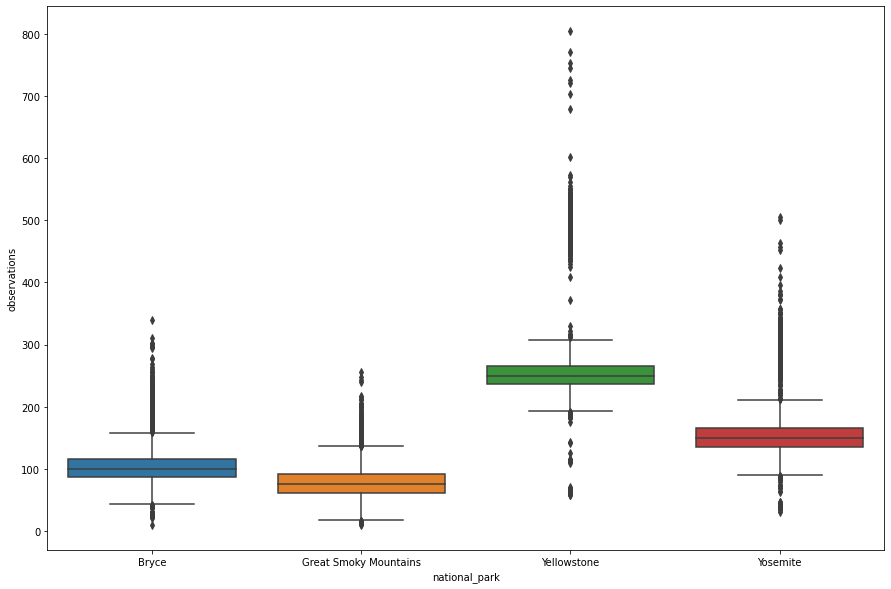

In [27]:
sns.boxplot(x='national_park', y='observations', data=obs)

In [28]:
obs.groupby('national_park').observations.describe()

,count,mean,std,min,25%,50%,75%,max
national_park,,,,,,,,
Bryce,5541.0,103.956867,30.720037,9.0,86.0,100.0,115.0,339.0
Great Smoky Mountains,5541.0,77.931781,26.703980,10.0,61.0,75.0,91.0,256.0
Yellowstone,5541.0,260.523732,60.837818,57.0,236.0,250.0,265.0,805.0
Yosemite,5541.0,155.807977,39.968394,31.0,135.0,150.0,165.0,505.0


In [29]:
obs.groupby('national_park').observations.sum()

national_park
Bryce                     576025
Great Smoky Mountains     431820
Yellowstone              1443562
Yosemite                  863332
Name: observations, dtype: int64

#### Takeaways
- Yellowstone has the highest number and most average observations
- Great Smoky Mountains has the least number and lowest average observations

<AxesSubplot:xlabel='observations', ylabel='Count'>

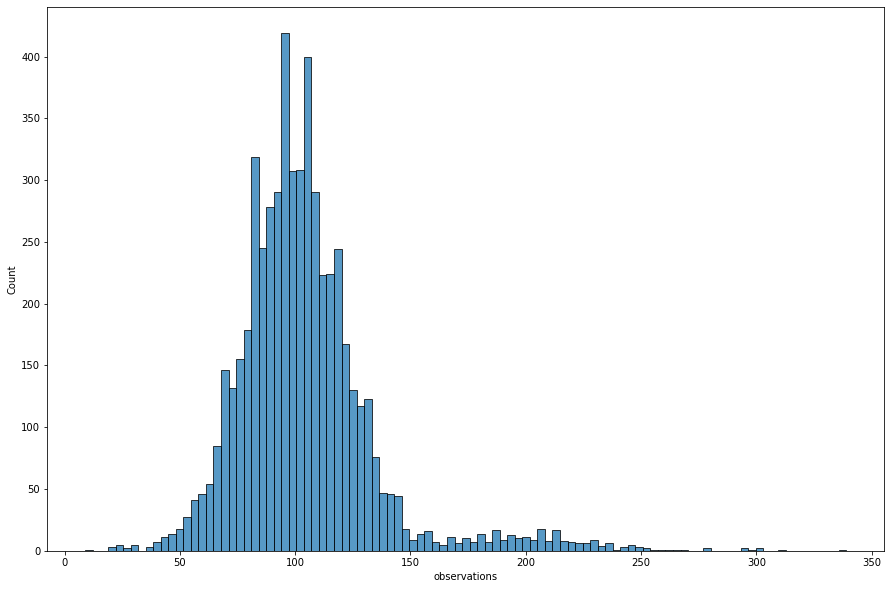

In [32]:
sns.histplot(x='observations', data=obs[obs['national_park'] == 'Bryce'])

<AxesSubplot:xlabel='observations', ylabel='Count'>

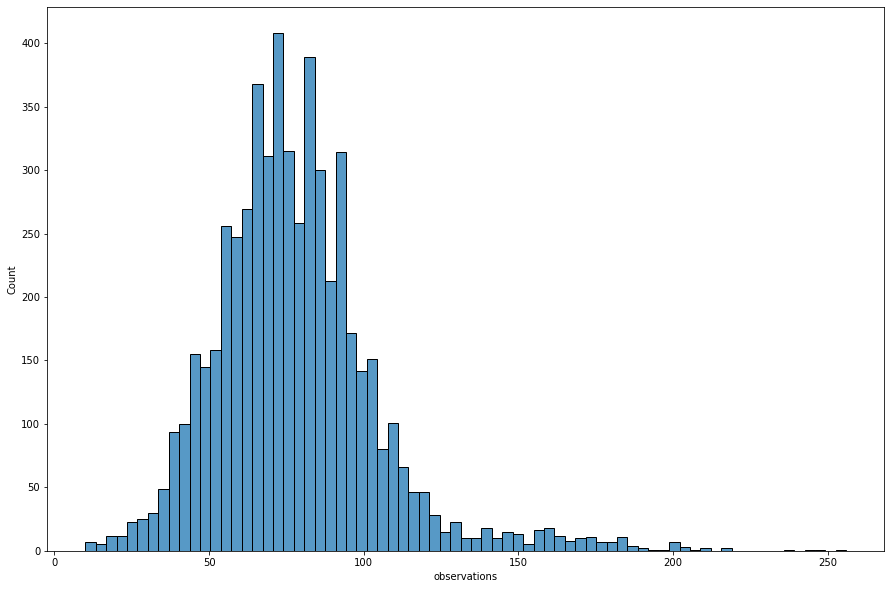

In [33]:
sns.histplot(x='observations', data=obs[obs['national_park'] == 'Great Smoky Mountains'])

<AxesSubplot:xlabel='observations', ylabel='Count'>

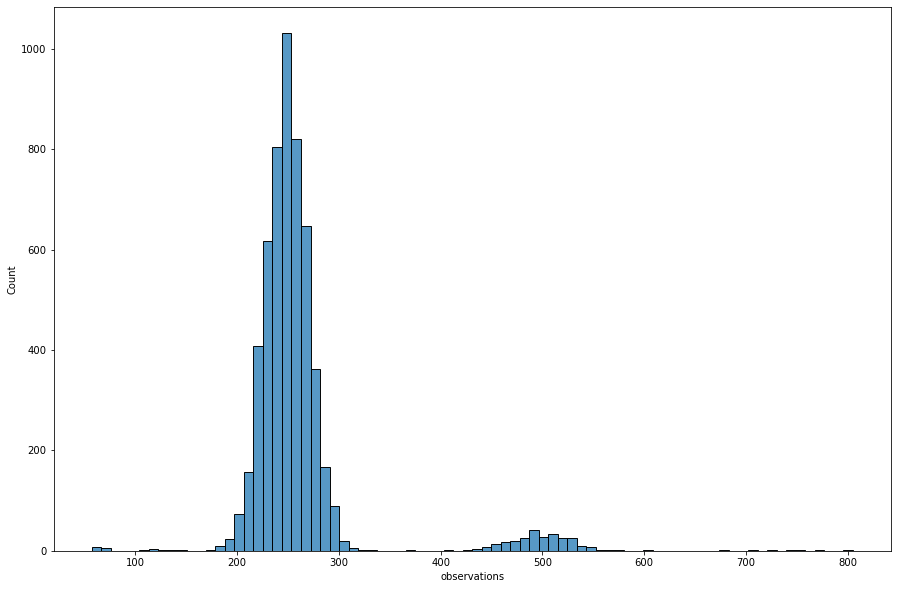

In [39]:
sns.histplot(x='observations', data=obs[obs['national_park'] == 'Yellowstone'], bins=80)

<AxesSubplot:xlabel='observations', ylabel='Count'>

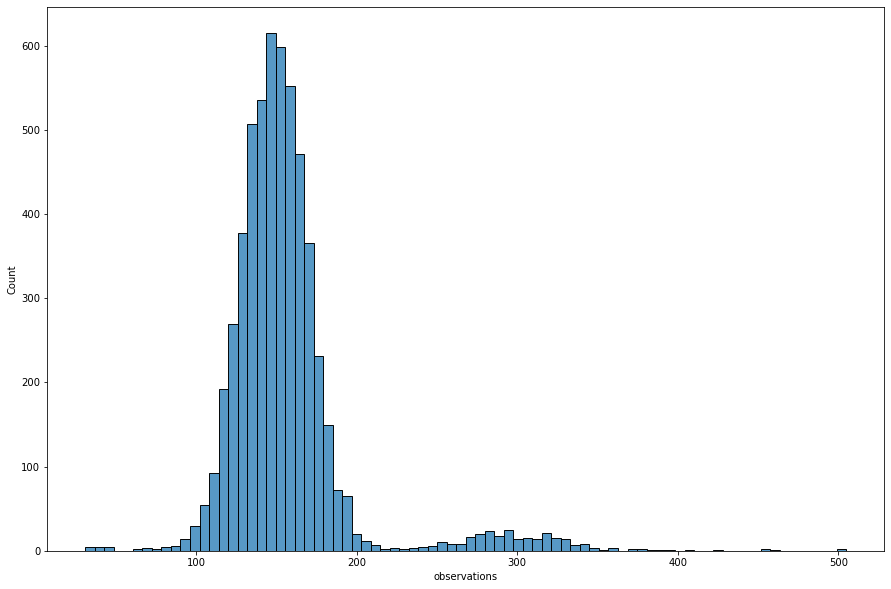

In [41]:
sns.histplot(x='observations', data=obs[obs['national_park'] == 'Yosemite'], bins=80)

#### Takeaways
- Majority of observations per national park is normally distributed
- obsevations at Yellowstone and Yosemite appear to have a second cluster of observations around 500 and 300 respectively

<AxesSubplot:xlabel='national_park', ylabel='observations'>

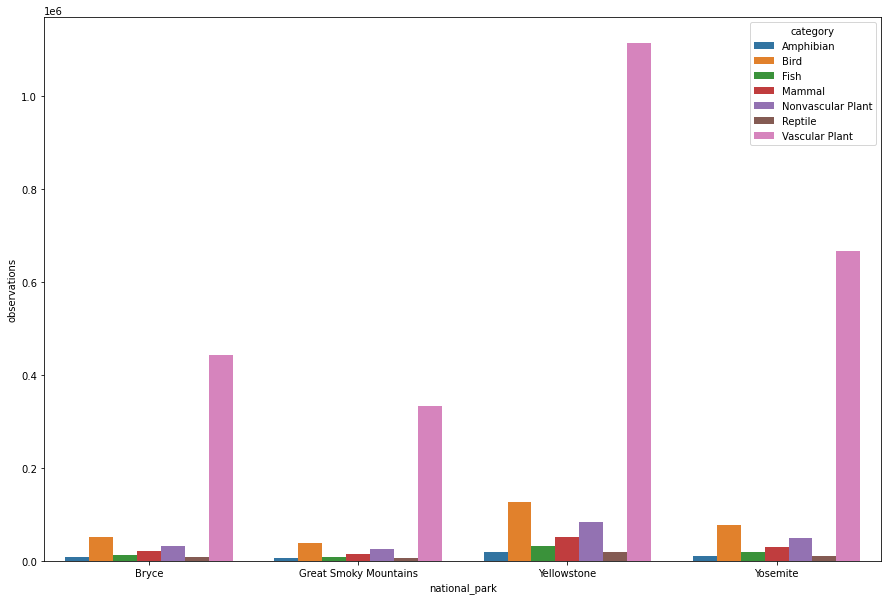

In [50]:
park_cat = comb.groupby(['national_park', 'category'])['observations'].sum().reset_index()
sns.barplot(x='national_park', y='observations', hue='category', data=park_cat)

<AxesSubplot:xlabel='national_park', ylabel='proportion'>

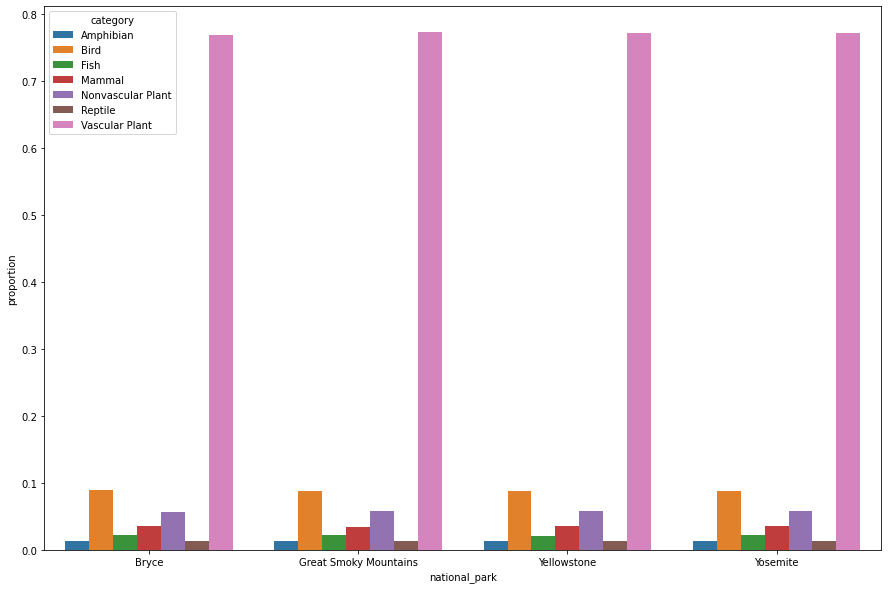

In [73]:
park_cat['proportion'] = park_cat['observations'] / park_cat.groupby('national_park')['observations'].transform('sum')
sns.barplot(x='national_park', y='proportion', hue='category', data=park_cat)

#### Takeaways
- Every national park has approximately the same proportion of observed wildlife classes

## Observations

In [64]:
comb.sort_values('observations').head(25)

,scientific_name,national_park,observations,category,conservation_status,common_names
5664,Corydalis aurea,Bryce,9,Vascular Plant,No Concern,"Golden Corydalis, Scrambled Eggs"
5425,Collomia tinctoria,Great Smoky Mountains,10,Vascular Plant,No Concern,"Staining Collomia, Yellowstain Collomia"
20009,Strix occidentalis,Great Smoky Mountains,11,Bird,No Concern,Spotted Owl
16997,Rana sierrae,Great Smoky Mountains,11,Amphibian,Endangered,Sierra Nevada Yellow-Legged Frog
18109,Sambucus mexicana,Great Smoky Mountains,12,Vascular Plant,No Concern,Mexican Elder
9297,Grus americana,Great Smoky Mountains,13,Bird,Endangered,Whooping Crane
3225,Canis rufus,Great Smoky Mountains,13,Mammal,Endangered,Red Wolf
18625,Seiurus aurocapilla,Great Smoky Mountains,13,Bird,No Concern,Ovenbird
13301,Myotis sodalis,Great Smoky Mountains,14,Mammal,Endangered,"Indiana Bat, Indiana Or Social Myotis"
12349,Malva moschata,Great Smoky Mountains,14,Vascular Plant,No Concern,Musk Mallow


In [65]:
comb.sort_values('observations', ascending=False).head(25)

,scientific_name,national_park,observations,category,conservation_status,common_names
9814,Holcus lanatus,Yellowstone,805,Vascular Plant,No Concern,"Common Velvet Grass, Common Velvetgrass, Velve..."
19982,Streptopelia decaocto,Yellowstone,771,Bird,No Concern,"Eurasian Collared Dove, Eurasian Collared-Dove"
16726,Puma concolor,Yellowstone,753,Mammal,No Concern,"Cougar, Mountain Lion, Panther (Mountain Lion)..."
16446,Procyon lotor,Yellowstone,745,Mammal,No Concern,"Common Raccoon, Northern Raccoon, Raccoon"
10226,Hypochaeris radicata,Yellowstone,726,Vascular Plant,No Concern,"Cat's Ear, Common Cat's-Ear, False Dandelion, ..."
5442,Columba livia,Yellowstone,722,Bird,No Concern,"Common Pigeon, Rock Dove, Rock Pigeon"
4418,Castor canadensis,Yellowstone,703,Mammal,No Concern,"American Beaver, Beaver"
13294,Myotis lucifugus,Yellowstone,679,Mammal,Species of Concern,"Little Brown Bat, Little Brown Myotis"
2334,Bidens tripartita,Yellowstone,602,Vascular Plant,No Concern,"Stick-Tight, Three-Lobe Beggar-Ticks, Three-Lo..."
19442,Sorex hoyi,Yellowstone,573,Mammal,No Concern,"American Pygmy Shrew, Pygmy Shrew"


#### Takeaways
- 23 of the 25 lowest observations by park occured at Great Smoky Mountains, the other 2 at Bryce
- The top 25 highest observations all occured at Yellowstone
- 10 of the lowest 25 observed wildlife had some level of conservation status
- only one of the top 25 observed wildlife by park had a conservation status

In [67]:
comb[comb['national_park'] == 'Bryce'].sort_values('observations').head(25)

,scientific_name,national_park,observations,category,conservation_status,common_names
5664,Corydalis aurea,Bryce,9,Vascular Plant,No Concern,"Golden Corydalis, Scrambled Eggs"
21432,Vermivora bachmanii,Bryce,20,Bird,Endangered,"Bachman's Warbler, Bachman's Wood Warbler"
13976,Ovis canadensis sierrae,Bryce,22,Mammal,Endangered,Sierra Nevada Bighorn Sheep
13580,Noturus baileyi,Bryce,22,Fish,Endangered,Smoky Madtom
4828,Chasmistes liorus,Bryce,23,Fish,Endangered,June Sucker
15120,Picoides borealis,Bryce,24,Bird,Endangered,Red-Cockaded Woodpecker
9296,Grus americana,Bryce,24,Bird,Endangered,Whooping Crane
9096,Geum radiatum,Bryce,25,Vascular Plant,Endangered,"Mountain Avens, Spreading Avens"
8124,Etheostoma percnurum,Bryce,25,Fish,Endangered,Duskytail Darter
13300,Myotis sodalis,Bryce,27,Mammal,Endangered,"Indiana Bat, Indiana Or Social Myotis"


In [70]:
comb[comb['national_park'] == 'Great Smoky Mountains'].sort_values('observations').head(25)

,scientific_name,national_park,observations,category,conservation_status,common_names
5425,Collomia tinctoria,Great Smoky Mountains,10,Vascular Plant,No Concern,"Staining Collomia, Yellowstain Collomia"
20009,Strix occidentalis,Great Smoky Mountains,11,Bird,No Concern,Spotted Owl
16997,Rana sierrae,Great Smoky Mountains,11,Amphibian,Endangered,Sierra Nevada Yellow-Legged Frog
18109,Sambucus mexicana,Great Smoky Mountains,12,Vascular Plant,No Concern,Mexican Elder
18625,Seiurus aurocapilla,Great Smoky Mountains,13,Bird,No Concern,Ovenbird
9297,Grus americana,Great Smoky Mountains,13,Bird,Endangered,Whooping Crane
3225,Canis rufus,Great Smoky Mountains,13,Mammal,Endangered,Red Wolf
12349,Malva moschata,Great Smoky Mountains,14,Vascular Plant,No Concern,Musk Mallow
13301,Myotis sodalis,Great Smoky Mountains,14,Mammal,Endangered,"Indiana Bat, Indiana Or Social Myotis"
9317,Gymnogyps californianus,Great Smoky Mountains,15,Bird,Endangered,California Condor


In [71]:
comb[comb['national_park'] == 'Yosemite'].sort_values('observations').head(25)

,scientific_name,national_park,observations,category,conservation_status,common_names
13583,Noturus baileyi,Yosemite,31,Fish,Endangered,Smoky Madtom
3227,Canis rufus,Yosemite,34,Mammal,Endangered,Red Wolf
4831,Chasmistes liorus,Yosemite,35,Fish,Endangered,June Sucker
9175,Glaucomys sabrinus coloratus,Yosemite,36,Mammal,Endangered,"Carolina Northern Flying Squirrel, Northern Fl..."
13303,Myotis sodalis,Yosemite,36,Mammal,Endangered,"Indiana Bat, Indiana Or Social Myotis"
9299,Grus americana,Yosemite,37,Bird,Endangered,Whooping Crane
13979,Ovis canadensis sierrae,Yosemite,39,Mammal,Endangered,Sierra Nevada Bighorn Sheep
13283,Myotis grisescens,Yosemite,39,Mammal,Endangered,Gray Myotis
8127,Etheostoma percnurum,Yosemite,40,Fish,Endangered,Duskytail Darter
16999,Rana sierrae,Yosemite,42,Amphibian,Endangered,Sierra Nevada Yellow-Legged Frog


In [72]:
comb[comb['national_park'] == 'Yellowstone'].sort_values('observations').head(25)

,scientific_name,national_park,observations,category,conservation_status,common_names
9298,Grus americana,Yellowstone,57,Bird,Endangered,Whooping Crane
21434,Vermivora bachmanii,Yellowstone,58,Bird,Endangered,"Bachman's Warbler, Bachman's Wood Warbler"
3226,Canis rufus,Yellowstone,60,Mammal,Endangered,Red Wolf
16998,Rana sierrae,Yellowstone,60,Amphibian,Endangered,Sierra Nevada Yellow-Legged Frog
9098,Geum radiatum,Yellowstone,63,Vascular Plant,Endangered,"Mountain Avens, Spreading Avens"
9318,Gymnogyps californianus,Yellowstone,64,Bird,Endangered,California Condor
15122,Picoides borealis,Yellowstone,64,Bird,Endangered,Red-Cockaded Woodpecker
4830,Chasmistes liorus,Yellowstone,65,Fish,Endangered,June Sucker
13582,Noturus baileyi,Yellowstone,67,Fish,Endangered,Smoky Madtom
13978,Ovis canadensis sierrae,Yellowstone,67,Mammal,Endangered,Sierra Nevada Bighorn Sheep


#### Takeaways
- There seems to be lots of variation in the least observed wildlife by park
- The number of wildlife by park with conservation status is 16, 9, 21, 25, for Bryce, GSM, Yosemite, and Yellowstone respectively
- There seems to be no pattern in the class of category of wildlife least observed by park

<AxesSubplot:xlabel='national_park', ylabel='count'>

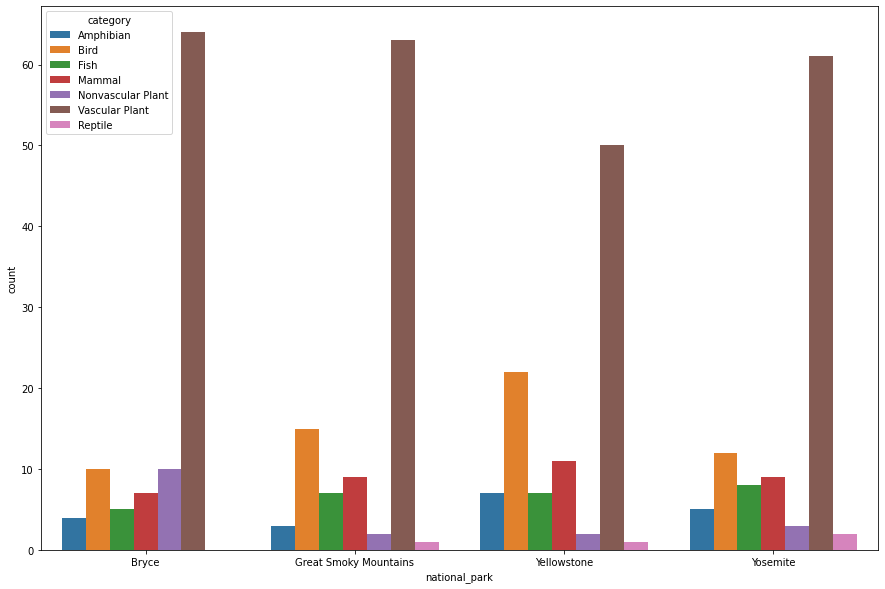

In [79]:
bot_100_bry = comb[comb['national_park'] == 'Bryce'].sort_values('observations').head(100)
bot_100_gsm = comb[comb['national_park'] == 'Great Smoky Mountains'].sort_values('observations').head(100)
bot_100_yel = comb[comb['national_park'] == 'Yellowstone'].sort_values('observations').head(100)
bot_100_yos = comb[comb['national_park'] == 'Yosemite'].sort_values('observations').head(100)
bot_100_all = pd.concat([bot_100_bry, bot_100_gsm, bot_100_yel, bot_100_yos])
park_cat_bot_100 = bot_100_all.groupby(['national_park', 'category'])['scientific_name'].count().reset_index().rename(columns={'scientific_name': 'count'})
sns.barplot(x='national_park', y='count', hue='category', data=park_cat_bot_100)

<AxesSubplot:xlabel='national_park', ylabel='count'>

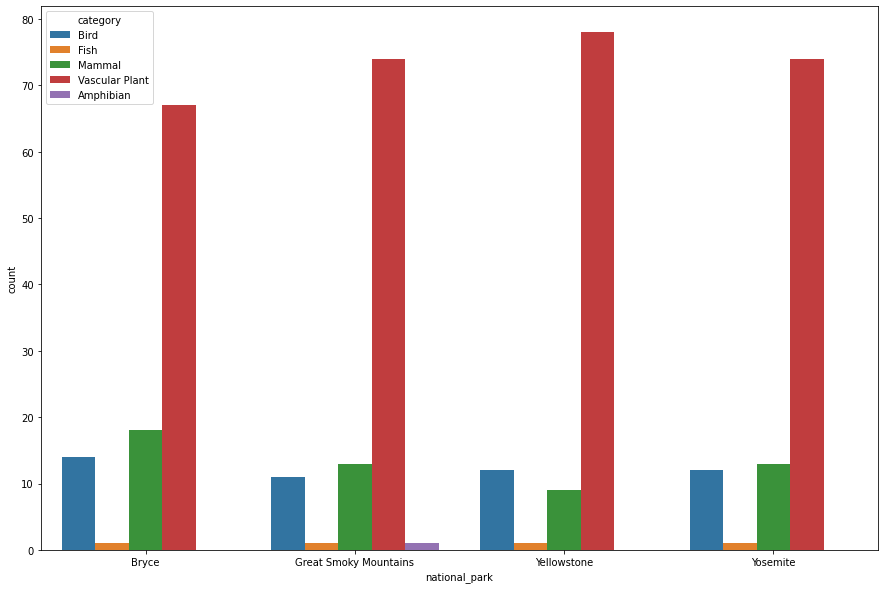

In [80]:
top_100_bry = comb[comb['national_park'] == 'Bryce'].sort_values('observations', ascending=False).head(100)
top_100_gsm = comb[comb['national_park'] == 'Great Smoky Mountains'].sort_values('observations', ascending=False).head(100)
top_100_yel = comb[comb['national_park'] == 'Yellowstone'].sort_values('observations', ascending=False).head(100)
top_100_yos = comb[comb['national_park'] == 'Yosemite'].sort_values('observations', ascending=False).head(100)
top_100_all = pd.concat([top_100_bry, top_100_gsm, top_100_yel, top_100_yos])
park_cat_top_100 = top_100_all.groupby(['national_park', 'category'])['scientific_name'].count().reset_index().rename(columns={'scientific_name': 'count'})
sns.barplot(x='national_park', y='count', hue='category', data=park_cat_top_100)

#### Takeaways
- The majority of most obsered and least observed wildlife categories are Vascular Plants
- Of the top 100 wildlife observations in each park
    - None of them are reptiles or nonvascular plants
    - Only 1 are fish in each park
    - Only GSM has an amphibian in the top 100
    - Bryca had the greatest amount of birds and mammals in the top 100
- Of the bottom 100 wildlife observations in each park
    - Yellowstone had the most birds present
    - Bryce had the most Nonvascular plants present
    - Reptiles had the lowest presence in the least observed lists (but also lowest portion from observations)
- There is more variation in the classes of animals most observed and least observed in each park than there is with amount of observations per park by class

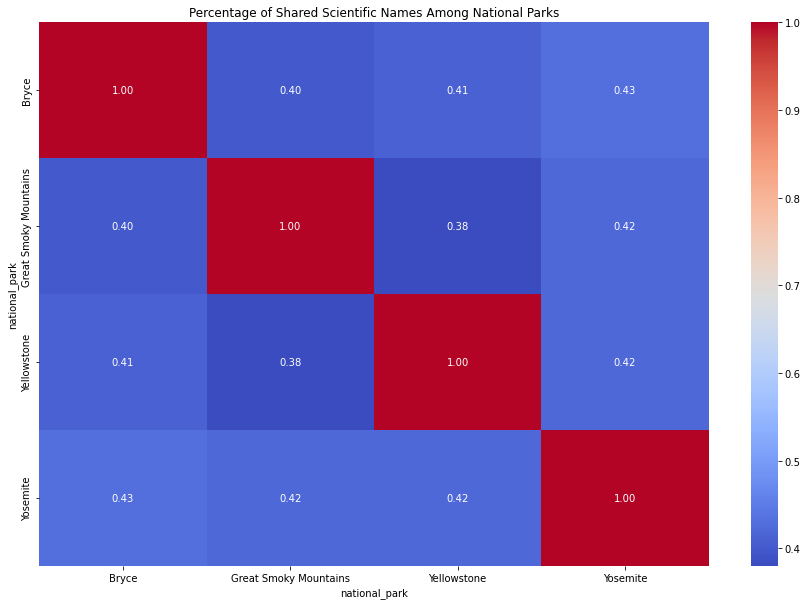

In [90]:
presence_matrix_top = pd.crosstab(top_100_all['scientific_name'], top_100_all['national_park'])
shared_percentages_top = presence_matrix_top.T.dot(presence_matrix_top) / 100

sns.heatmap(shared_percentages_top, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Percentage of Shared Scientific Names Among National Parks')
plt.show()

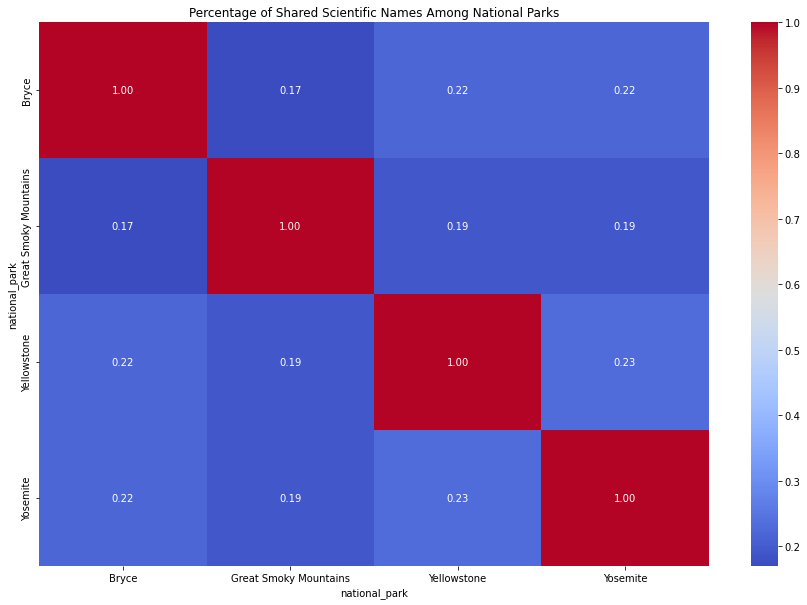

In [91]:
presence_matrix_bot = pd.crosstab(bot_100_all['scientific_name'], bot_100_all['national_park'])
shared_percentages_bot = presence_matrix_bot.T.dot(presence_matrix_bot) / 100

sns.heatmap(shared_percentages_bot, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Percentage of Shared Scientific Names Among National Parks')
plt.show()

In [94]:
common_species = top_100_all.groupby('scientific_name').filter(lambda x: x['national_park'].nunique() == top_100_all['national_park'].nunique())
total_unique_species = top_100_all['scientific_name'].nunique()
common_species_count = common_species['scientific_name'].nunique()
common_species_count / total_unique_species

0.049773755656108594

In [95]:
common_species = bot_100_all.groupby('scientific_name').filter(lambda x: x['national_park'].nunique() == bot_100_all['national_park'].nunique())
total_unique_species = bot_100_all['scientific_name'].nunique()
common_species_count = common_species['scientific_name'].nunique()
common_species_count / total_unique_species

0.04833836858006042

#### Takeaways
- There is ~40% crossover of wildlife between parks in their resepctive top 100 observed lists
- There is ~20% crossover of wildlife between parks in their respective bottom 100 observed lists
- Roughly ~5% of the wildlife found in the top 100 observed wildlife lists are found in ever park (The same is true for the bottom 100 lists)

#### Insights
- There seems to be significant differences betweens the most and least observed wildlife in each park, this could be an interesting area to investigate further as it could reveal differences in the types of wildlife that are best acclimated to each park

## Conservation Status

In [96]:
species

,category,scientific_name,conservation_status,common_names
0,Amphibian,Acris crepitans crepitans,No Concern,Northern Cricket Frog
1,Amphibian,Ambystoma maculatum,No Concern,Spotted Salamander
2,Amphibian,Ambystoma mavortium melanostictum,No Concern,Blotched Tiger Salamander
3,Amphibian,Ambystoma opacum,No Concern,Marbled Salamander
4,Amphibian,Ambystoma talpoideum,No Concern,Mole Salamander
5,Amphibian,Anaxyrus boreas boreas,No Concern,Boreal Toad
6,Amphibian,Anaxyrus boreas halophilus,No Concern,California Toad (Western Toad)
7,Amphibian,Anaxyrus canorus,Threatened,Yosemite Toad
8,Amphibian,Aneides lugubris,No Concern,Arboreal Salamander
9,Amphibian,Batrachoseps diabolicus,No Concern,Hell Hollow Slender Salamander


<AxesSubplot:xlabel='conservation_status', ylabel='count'>

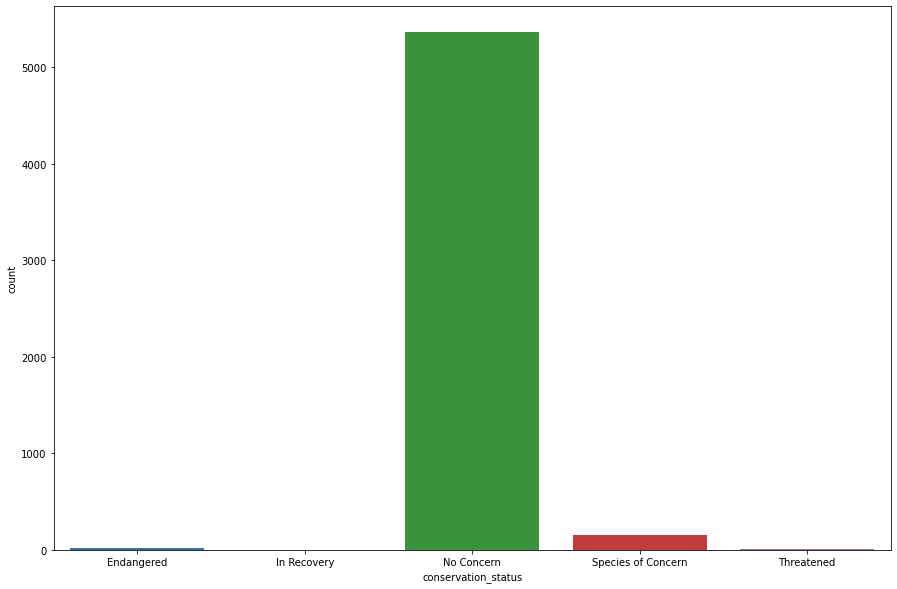

In [109]:
conservation_counts = species.groupby(['conservation_status', 'category'])['scientific_name'].count().reset_index().rename(columns={'scientific_name': 'count'})
consveration_counts_concern = conservation_counts[conservation_counts['conservation_status'] != 'No Concern']
sns.barplot(x='conservation_status', y='count', data=conservation_counts.groupby('conservation_status')['count'].sum().reset_index())

<AxesSubplot:xlabel='conservation_status', ylabel='count'>

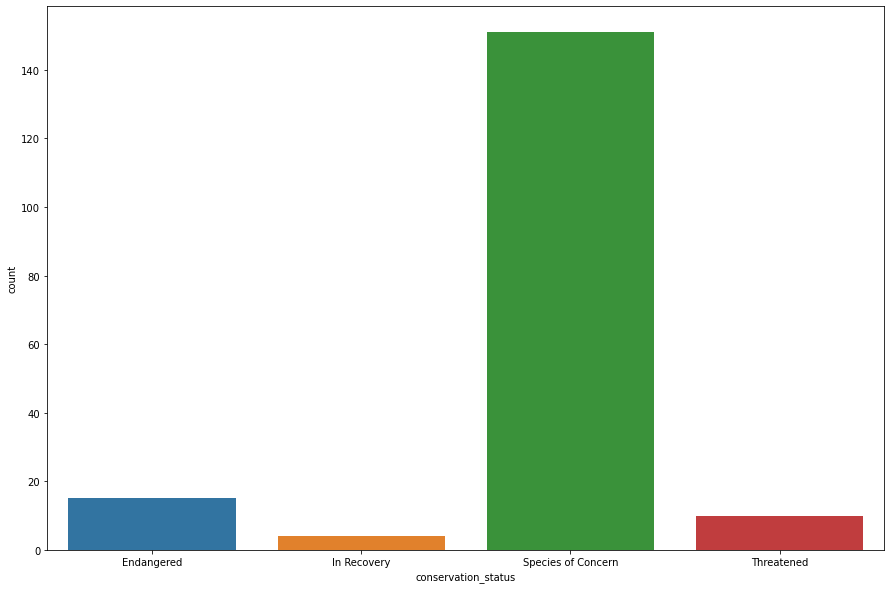

In [110]:
sns.barplot(x='conservation_status', y='count', data=consveration_counts_concern.groupby('conservation_status')['count'].sum().reset_index())

#### Takeaways
- Most wildlife have no conservation status
- Of those that have a conservation status, 'Species of Concern' has the highest count and 'In Recovery' has the lowest count

<AxesSubplot:xlabel='conservation_status', ylabel='count'>

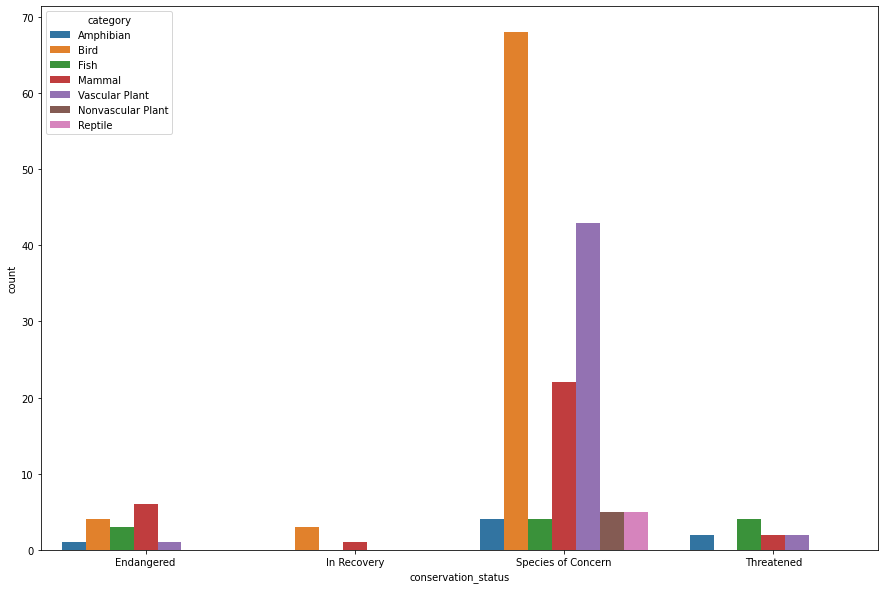

In [111]:
sns.barplot(x='conservation_status', y='count', hue='category', data=consveration_counts_concern)

#### Takeaways
- Of wildlife with a conservation status, Birds have the highest count. This is interesting because they have they make up a significantly higher percentage of animals with conservation status compared to the overall count of observations
- Of the wildlife with 'Endangered' status, there are the most mammals

<AxesSubplot:xlabel='conservation_status', ylabel='observations'>

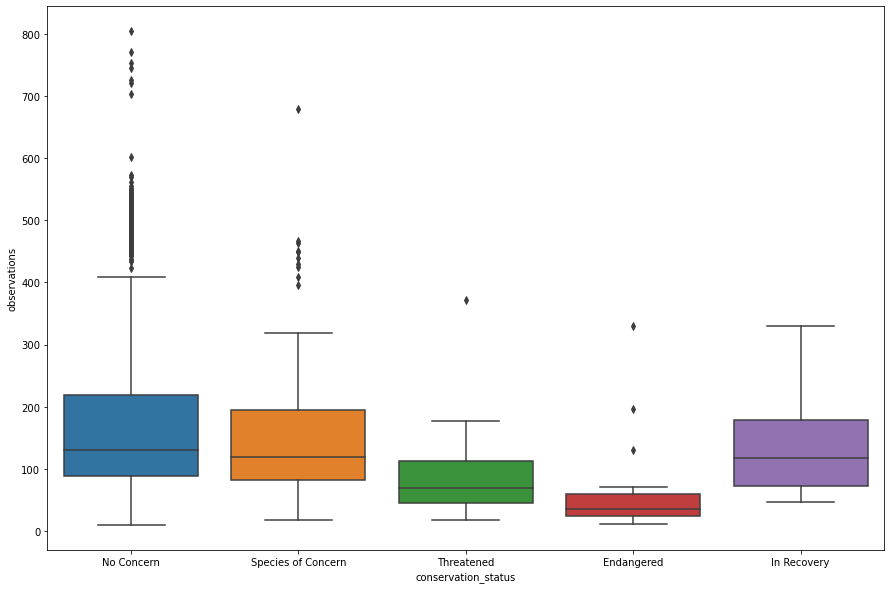

In [112]:
sns.boxplot(x='conservation_status', y='observations', data=comb)

#### Takeaways
- Endangered and Threatend animals have the least median observations